In [142]:
using Distributions
using StatsPlots
using StatsBase
using LaTeXStrings
using CSV
using DataFrames
using StatisticalRethinking
using StatisticalRethinking: link
using LinearAlgebra
using Logging
using Random
using Turing

# setting default attributes for plots
default(label=false)
Logging.disable_logging(Logging.Warn);

# 4.1 Why normal distributions are normal

R runif(): random sampel 16 times from a uniform distribution (-1,1)

## Code 4.1

size(n) = (1000, 16)


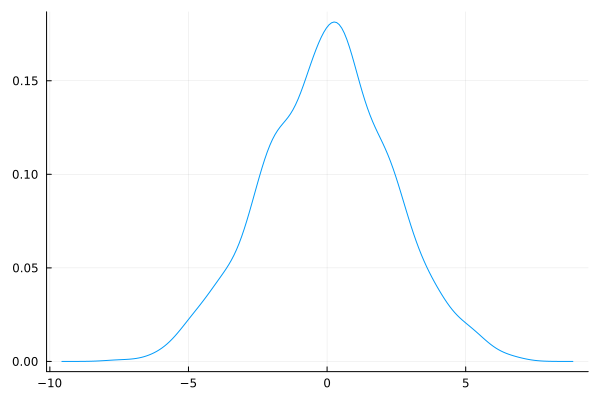

In [87]:
n = rand(Uniform(-1, 1), 1000, 16);
@show size(n)
pos = sum.(eachrow(n));
density(pos)

## Code 4.2

In [88]:
prod(1 .+ rand(Uniform(0, .1), 12))

1.9238685493194037

## Code 4.3

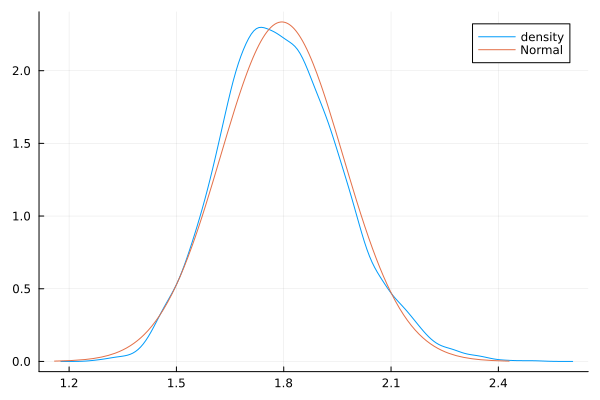

In [89]:
u = Uniform(0, .1)
growth = prod.(eachrow(1 .+ rand(u, 10000, 12)));

density(growth; label="density")
# overlay normal distribution
μ = mean(growth)
σ = std(growth)
plot!(Normal(μ, σ); label="Normal")

## Code 4.4

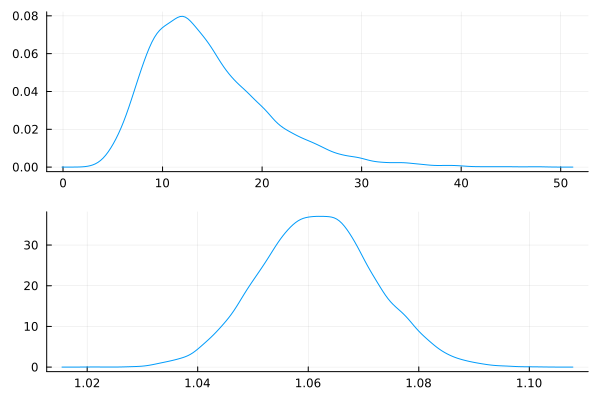

In [90]:
big = prod.(eachrow(1 .+ rand(Uniform(0, 0.5), 10000, 12)));
small = prod.(eachrow(1 .+ rand(Uniform(0, 0.01), 10000, 12)));
density([big, small]; layout=(2, 1))

## Code 4.5

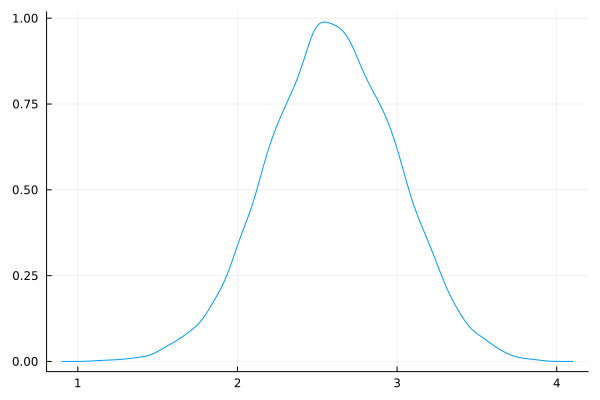

In [91]:
density(log.(big))

# 4.2 A language for describing models

## Code 4.6

In [136]:
w = 6
n = 9
p_grid = range(0, 1; length=100)
bin_dens = [pdf(Binomial(n, p), w) for p in p_grid]
uni_dens = [pdf(Uniform(0, 1), p) for p in p_grid];
posterior = bin_dens .* uni_dens
posterior /= sum(posterior);

In [137]:
posterior

100-element Vector{Float64}:
 0.0
 8.741893987914909e-12
 5.425284098722297e-10
 5.990575360568051e-9
 3.261805587160897e-8
 1.2053991899464767e-7
 3.485649034505518e-7
 8.509009932076811e-7
 1.834811305202922e-6
 3.598403772645905e-6
 6.547828990010935e-6
 1.1213248218015673e-5
 1.826301780861177e-5
 ⋮
 0.0057411830876240195
 0.004616016455259013
 0.0035984037726459104
 0.0027005089649864604
 0.0019317387539326666
 0.0012980121298369258
 0.0008009482246260066
 0.00043696727582688777
 0.00019629917341509366
 6.189387892791484e-5
 8.227800686273486e-6
 0.0

# 4.3 Gaussian model of height

## Code 4.7

In [138]:
d = DataFrame(CSV.File("data/Howell1.csv"));

In [140]:
d

Row,height,weight,age,male
,Float64,Float64,Float64,Int64
1,151.765,47.8256,63.0,1
2,139.7,36.4858,63.0,0
3,136.525,31.8648,65.0,0
4,156.845,53.0419,41.0,1
5,145.415,41.2769,51.0,0
6,163.83,62.9926,35.0,1
7,149.225,38.2435,32.0,0
8,168.91,55.48,27.0,1
9,147.955,34.8699,19.0,0


In [139]:
size(d)

(544, 4)

## Code 4.8

In [94]:
describe(d)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Real,Float64,Real,Int64,DataType
1,height,138.264,53.975,148.59,179.07,0,Float64
2,weight,35.6106,4.25242,40.0578,62.9926,0,Float64
3,age,29.3444,0.0,27.0,88.0,0,Float64
4,male,0.472426,0,0.0,1,0,Int64


## Code 4.9

In [95]:
precis(d)

┌────────┬────────────────────────────────────────────────────────────┐
│  param │    mean      std     5.5%      50%    94.5%      histogram │
├────────┼────────────────────────────────────────────────────────────┤
│ height │ 138.264  27.6024  81.1086   148.59  165.735  ▁▁▁▂▂▂▂▂▂██▆▁ │
│ weight │ 35.6106  14.7192   9.3607  40.0578  54.5029  ▁▃▄▄▃▂▃▆██▅▃▁ │
│    age │ 29.3444  20.7469      1.0     27.0   66.135      █▆▆▆▆▃▃▁▁ │
│   male │  0.4724   0.4997      0.0      0.0      1.0    █▁▁▁▁▁▁▁▁▁█ │
└────────┴────────────────────────────────────────────────────────────┘


## Code 4.10

In [96]:
d.height

544-element Vector{Float64}:
 151.765
 139.7
 136.525
 156.845
 145.415
 163.83
 149.225
 168.91
 147.955
 165.1
 154.305
 151.13
 144.78
   ⋮
 156.21
 152.4
 162.56
 114.935
  67.945
 142.875
  76.835
 145.415
 162.56
 156.21
  71.12
 158.75

## Code 4.11

In [97]:
d2 = d[d.age .>= 18,:];

In [98]:
size(d2)

(352, 4)

## Code 4.12

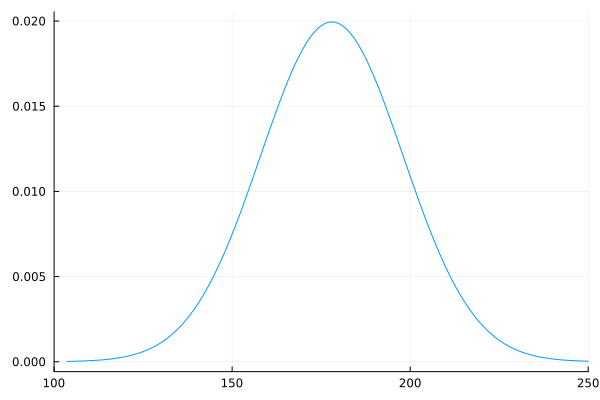

In [99]:
plot(Normal(178, 20); xlim=(100, 250))

## Code 4.13

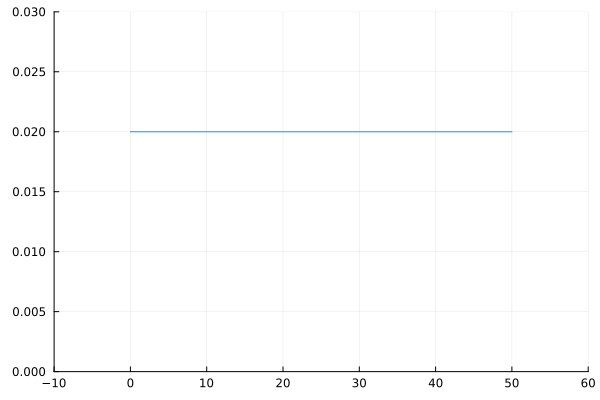

In [100]:
plot(Uniform(0, 50), xlim=(-10, 60), ylim=(0, 0.03))

## Code 4.14

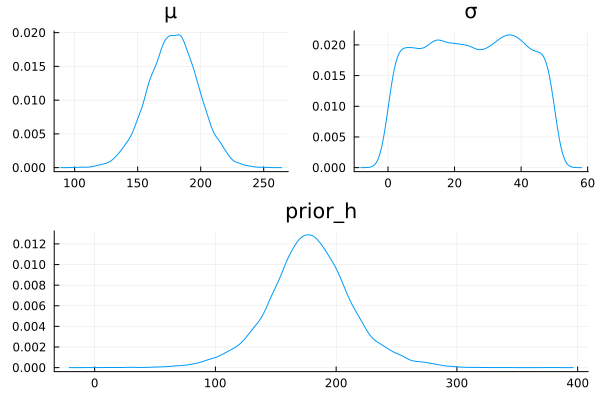

In [144]:
n = 10_000
sample_μ = rand(Normal(178, 20), n)
sample_σ = rand(Uniform(0, 50), n);
prior_h = [rand(Normal(μ, σ)) for (μ, σ) in zip(sample_μ, sample_σ)];

p1 = density(sample_μ; title="μ")
p2 = density(sample_σ; title="σ")
p3 = density(prior_h; title="prior_h")

plot(p1, p2, p3, layout=@layout [a b; c])

## Code 4.15

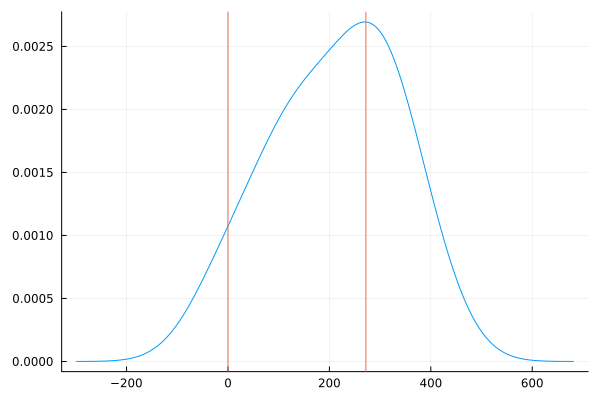

In [143]:
sample_μ = rand(Normal(178, 100), n)
prior_h = [rand(Normal(μ, σ)) for (μ, σ) in zip(sample_μ, sample_σ)];

density(prior_h)
vline!([0, 272])

## Code 4.16

In [151]:
μ_list = range(150, 160; length=100)
σ_list = range(7, 9; length=100)

log_likelihood = [
    sum(logpdf.(Normal(μ, σ), d2.height))
    for μ ∈ μ_list, σ ∈ σ_list
]
log_prod = log_likelihood .+ [
    logpdf.(Normal(178, 20), μ) + logpdf(Uniform(0, 50), σ)
    for μ ∈ μ_list, σ ∈ σ_list
];

max_prod = maximum(log_prod)
prob = @. exp(log_prod - max_prod);

In [146]:
@show size(log_likelihood)
@show size(log_prod)
@show size(prob)


size(log_likelihood) = (100, 100)
size(log_prod) = (100, 100)
size(prob) = (100, 100)


(100, 100)

In [147]:
prob

100×100 Matrix{Float64}:
 2.112e-35    4.06883e-35  7.74956e-35  …  5.82405e-24  5.8291e-24
 7.53425e-30  1.34889e-29  2.38901e-29     1.39305e-20  1.34662e-20
 8.31576e-25  1.39292e-24  2.30942e-24     1.63321e-17  1.52973e-17
 2.83974e-20  4.48039e-20  7.00053e-20     9.38543e-15  8.54485e-15
 3.00033e-16  4.48899e-16  6.65431e-16     2.64363e-12  2.34703e-12
 9.80789e-13  1.40095e-12  1.98344e-12  …  3.64991e-10  3.16996e-10
 9.91966e-10  1.36188e-9   1.85387e-9      2.47001e-8   2.1053e-8
 3.10408e-7   4.1238e-7    5.43352e-7      8.19314e-7   6.87535e-7
 3.00526e-5   3.88953e-5   4.99377e-5      1.3321e-5    1.10408e-5
 0.000900218  0.00114272   0.00143919      0.000106159  8.71822e-5
 0.00834311   0.0104574    0.0130063    …  0.000414682  0.000338515
 0.0239234    0.029809     0.036858        0.000793975  0.000646326
 0.0212242    0.0264676    0.0327531       0.000745132  0.000606803
 ⋮                                      ⋱               
 0.0          0.0          0.0          

In [148]:
size(μ_list)

(100,)

In [149]:
sizeof(prob)

80000

## Code 4.17

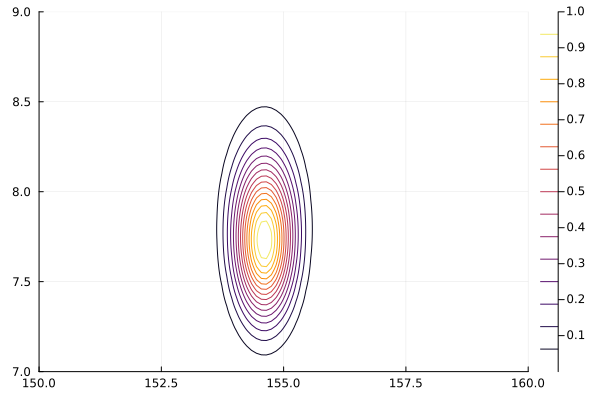

In [152]:
# note the transposition, that's due to Julia matrix order
contour(μ_list, σ_list, prob')

## Code 4.18

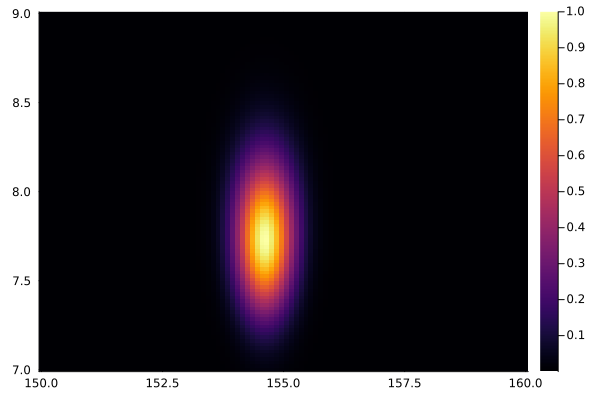

In [109]:
heatmap(μ_list, σ_list, prob')

## Code 4.19

In [110]:
indices = collect(Iterators.product(1:length(μ_list), 1:length(σ_list)));
sample_idx = wsample(vec(indices), vec(prob), 10_000; replace=true)
sample_μ = μ_list[first.(sample_idx)]
sample_σ = σ_list[last.(sample_idx)];

In [111]:
@show size(indices)
@show size(sample_idx)
@show size(sample_μ)

size(indices) = (100, 100)
size(sample_idx) = (10000,)
size(sample_μ) = (10000,)


(10000,)

In [112]:
indices

100×100 Matrix{Tuple{Int64, Int64}}:
 (1, 1)    (1, 2)    (1, 3)    (1, 4)    …  (1, 98)    (1, 99)    (1, 100)
 (2, 1)    (2, 2)    (2, 3)    (2, 4)       (2, 98)    (2, 99)    (2, 100)
 (3, 1)    (3, 2)    (3, 3)    (3, 4)       (3, 98)    (3, 99)    (3, 100)
 (4, 1)    (4, 2)    (4, 3)    (4, 4)       (4, 98)    (4, 99)    (4, 100)
 (5, 1)    (5, 2)    (5, 3)    (5, 4)       (5, 98)    (5, 99)    (5, 100)
 (6, 1)    (6, 2)    (6, 3)    (6, 4)    …  (6, 98)    (6, 99)    (6, 100)
 (7, 1)    (7, 2)    (7, 3)    (7, 4)       (7, 98)    (7, 99)    (7, 100)
 (8, 1)    (8, 2)    (8, 3)    (8, 4)       (8, 98)    (8, 99)    (8, 100)
 (9, 1)    (9, 2)    (9, 3)    (9, 4)       (9, 98)    (9, 99)    (9, 100)
 (10, 1)   (10, 2)   (10, 3)   (10, 4)      (10, 98)   (10, 99)   (10, 100)
 (11, 1)   (11, 2)   (11, 3)   (11, 4)   …  (11, 98)   (11, 99)   (11, 100)
 (12, 1)   (12, 2)   (12, 3)   (12, 4)      (12, 98)   (12, 99)   (12, 100)
 (13, 1)   (13, 2)   (13, 3)   (13, 4)      (13, 98)   (13, 

In [113]:
?wsample

search: wsample wsample!



```
wsample([rng], [a], w)
```

Select a weighted random sample of size 1 from `a` with probabilities proportional to the weights given in `w`. If `a` is not present, select a random weight from `w`.

Optionally specify a random number generator `rng` as the first argument (defaults to `Random.GLOBAL_RNG`).

---

```
wsample([rng], [a], w, n::Integer; replace=true, ordered=false)
```

Select a weighted random sample of size `n` from `a` with probabilities proportional to the weights given in `w` if `a` is present, otherwise select a random sample of size `n` of the weights given in `w`. `replace` dictates whether sampling is performed with replacement. `ordered` dictates whether an ordered sample (also called a sequential sample, i.e. a sample where items appear in the same order as in `a`) should be taken.

Optionally specify a random number generator `rng` as the first argument (defaults to `Random.GLOBAL_RNG`).

---

```
wsample([rng], [a], w, dims::Dims; replace=true, ordered=false)
```

Select a weighted random sample from `a` with probabilities proportional to the weights given in `w` if `a` is present, otherwise select a random sample of size `n` of the weights given in `w`. The dimensions of the output are given by `dims`.

Optionally specify a random number generator `rng` as the first argument (defaults to `Random.GLOBAL_RNG`).


## Code 4.20

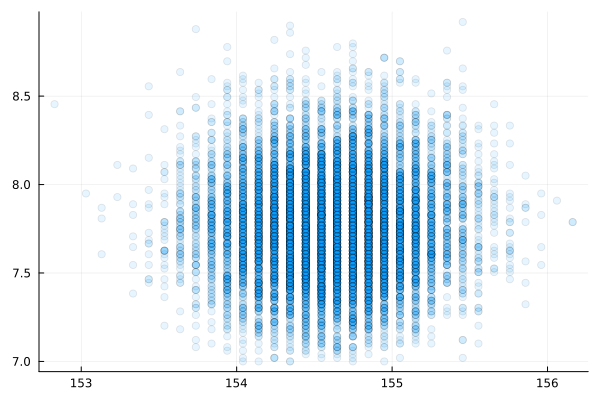

In [114]:
scatter(sample_μ, sample_σ; alpha=0.1)

## Code 4.21

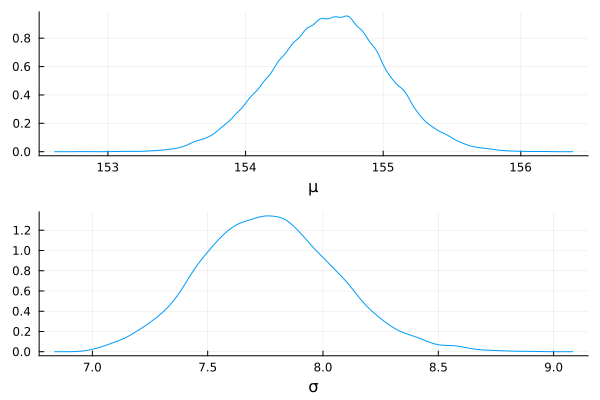

In [115]:
p1 = density(sample_μ, xaxis="μ")
p2 = density(sample_σ, xaxis="σ")
plot(p1, p2, layout=(2,1))

Pr(p|w) = (Pr(w|p)* Pr(p) )/P(w)

P(w) = \integral Pr(w, p) dp

## Code 4.22

In [116]:
println(hpdi(sample_μ, alpha=0.11))
println(hpdi(sample_σ, alpha=0.11))

[153.83838383838383, 155.15151515151516]
[7.242424242424242, 8.171717171717171]


## Code 4.23

In [117]:
d3 = sample(d2.height, 20);

## Code 4.24

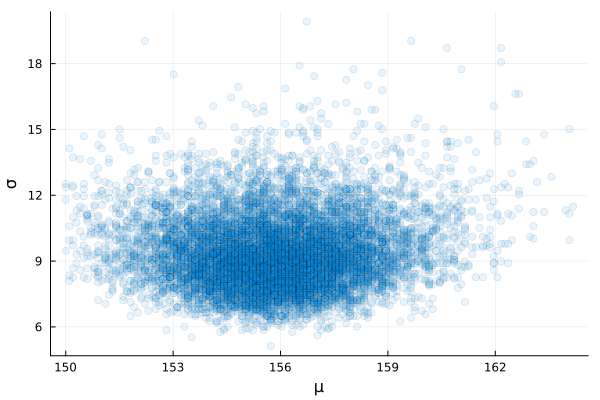

In [153]:
μ_list = range(150, 170; length=200)
σ_list = range(4, 20; length=200)

log_likelihood = [
    sum(logpdf.(Normal(μ, σ), d3))
    for μ ∈ μ_list, σ ∈ σ_list
]
log_prod = log_likelihood .+ [
    logpdf.(Normal(178, 20), μ) + logpdf(Uniform(0, 50), σ)
    for μ ∈ μ_list, σ ∈ σ_list
]

max_prod = maximum(log_prod)
prob2 = @. exp(log_prod - max_prod)

indices = collect(Iterators.product(1:length(μ_list), 1:length(σ_list)));
sample2_idx = wsample(vec(indices), vec(prob2), 10_000; replace=true)
sample2_μ = μ_list[first.(sample2_idx)]
sample2_σ = σ_list[last.(sample2_idx)]

scatter(sample2_μ, sample2_σ; xaxis="μ", yaxis="σ", alpha=0.1)

## Code 4.25

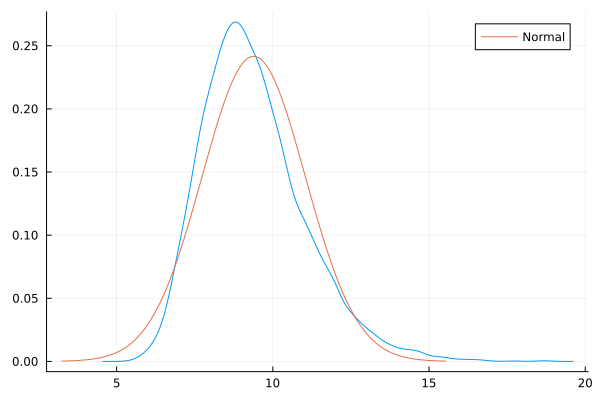

In [119]:
density(sample2_σ)
μ = mean(sample2_σ)
σ = std(sample2_σ)
plot!(Normal(μ, σ); label="Normal")

## Code 4.26

In [120]:
d = DataFrame(CSV.File("data/Howell1.csv"));
d2 = d[d.age .>= 18,:];

## Code 4.27

In [121]:
@model function model_height(height)
    μ ~ Normal(178, 20)
    σ ~ Uniform(0, 50)
    height ~ Normal(μ, σ)
end

model_height (generic function with 2 methods)

## Code 4.28

In [122]:
@time m4_1 = sample(model_height(d2.height), NUTS(), 1000)

  3.029424 seconds (1.40 M allocations: 105.038 MiB, 2.95% gc time, 96.65% compilation time: 83% of which was recompilation)


Chains MCMC chain (1000×14×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 1.72 seconds
Compute duration  = 1.72 seconds
parameters        = μ, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

           μ   154.5867    0.4316    0.0153    800.6991   374.0563    1.0046   ⋯
           σ     7.7859    0.3004    0.0095   1012.5037   763.2700    1.0003   ⋯
                                                                1 column omitted

Quantiles
  parameters       2.5%      25.0%      50.0%      75.0%      97.5% 
      Symbol    Float64    Float64    Float64    Float64    Float64 

 

## Code 4.29

In [123]:
display.(describe(m4_1; q=[0.055, 0.945]));

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

           μ   154.5867    0.4316    0.0153    800.6991   374.0563    1.0046   ⋯
           σ     7.7859    0.3004    0.0095   1012.5037   763.2700    1.0003   ⋯
                                                                1 column omitted


Quantiles
  parameters       5.5%      94.5% 
      Symbol    Float64    Float64 

           μ   153.9200   155.2667
           σ     7.3270     8.2670


## Code 4.30

In [124]:
init_vals = [mean(d2.height), std(d2.height)]
@time chain = sample(model_height(d2.height), NUTS(), 1000, init_theta=init_vals)

  1.556262 seconds (1.08 M allocations: 83.239 MiB, 2.21% gc time, 92.81% compilation time: 77% of which was recompilation)


Chains MCMC chain (1000×14×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 0.84 seconds
Compute duration  = 0.84 seconds
parameters        = μ, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

           μ   154.6160    0.4055    0.0116   1210.8422   902.2307    1.0012   ⋯
           σ     7.7715    0.3005    0.0088   1142.0764   622.1978    1.0007   ⋯
                                                                1 column omitted

Quantiles
  parameters       2.5%      25.0%      50.0%      75.0%      97.5% 
      Symbol    Float64    Float64    Float64    Float64    Float64 

 

## Code 4.31

In [125]:
@model function model_height(height)
    μ ~ Normal(178, 0.1)
    σ ~ Uniform(0, 50)
    height ~ Normal(μ, σ)
end

m4_2 = sample(model_height(d2.height), NUTS(), 1000)
display.(describe(m4_2; q=[0.055, 0.945]));

Summary Statistics
  parameters       mean       std      mcse   ess_bulk   ess_tail      rhat    ⋯
      Symbol    Float64   Float64   Float64    Float64    Float64   Float64    ⋯

           μ   177.8658    0.1024    0.0034   911.7473   754.4867    1.0030    ⋯
           σ    24.6179    0.9382    0.0377   623.3433   637.6521    1.0103    ⋯
                                                                1 column omitted


Quantiles
  parameters       5.5%      94.5% 
      Symbol    Float64    Float64 

           μ   177.6966   178.0312
           σ    23.1390    26.1483


## Code 4.32

In [126]:
cov(hcat(m4_1[:μ], m4_1[:σ]))

2×2 Matrix{Float64}:
  0.186249    -0.00483918
 -0.00483918   0.0902468

## Code 4.33

In [127]:
@show c = cov(hcat(m4_1[:μ], m4_1[:σ]))
@show diag(c)
@show cov2cor(c, diag(c))

c = cov(hcat(m4_1[:μ], m4_1[:σ])) = [0.18624887743116322 -0.004839177131354558; -0.004839177131354558 0.09024679714745011]
diag(c) = [0.18624887743116322, 0.09024679714745011]
cov2cor(c, diag(c)) = [1.0 -0.2879029119790113; -0.2879029119790113 1.0]


2×2 Matrix{Float64}:
  1.0       -0.287903
 -0.287903   1.0

## Code 4.34

In [154]:
samp_chain2 = sample(m4_1, 10_000)
samp_df2 = DataFrame(samp_chain2)
@show size(samp_df2)
# check the top 5 values from this data frame
first(samp_df2, 5)

size(samp_df2) = (10000, 2)


Row,μ,σ
,Float64,Float64
1,155.152,8.36986
2,154.293,8.01735
3,155.372,8.07262
4,154.287,7.76349
5,154.958,7.59193


- 20230513 sampling from the chain directly is fixed. resetrange() is no longer needed.

- resetrange() is needed due to bug in MCMCChains: https://github.com/TuringLang/MCMCChains.jl/issues/324
- Once it will be fixed, direct sampling from the chain will be possible

In [128]:
samp_chain = sample(resetrange(m4_1), 10_000)
samp_df = DataFrame(samp_chain)
first(samp_df, 5)

Row,μ,σ
,Float64,Float64
1,154.616,7.74601
2,154.308,7.85827
3,154.568,7.76855
4,154.751,8.19759
5,154.446,7.28342


In [129]:
?resetrange

search: resetrange



```
resetrange(chains::Chains)
```

Generate a new chain from `chains` with iterations indexed by `1:n`, where `n` is the number of samples per chain.

The new chain and `chains` share the same data in memory.


In [130]:
parentmodule(resetrange)

MCMCChains

In [132]:
precis(samp_df2)

┌───────┬──────────────────────────────────────────────────────────┐
│ param │    mean     std     5.5%     50%    94.5%      histogram │
├───────┼──────────────────────────────────────────────────────────┤
│     μ │ 154.591  0.4344  153.917  154.59  155.281        ▁▂▇█▄▁▁ │
│     σ │  7.7827  0.3021    7.307  7.7664   8.2665  ▁▁▁▃▅█▇▅▃▁▁▁▁ │
└───────┴──────────────────────────────────────────────────────────┘


## Code 4.35

In [133]:
precis(samp_df)

┌───────┬───────────────────────────────────────────────────────────┐
│ param │    mean     std     5.5%      50%    94.5%      histogram │
├───────┼───────────────────────────────────────────────────────────┤
│     μ │ 154.588  0.4289  153.927  154.588  155.267        ▁▂▇█▃▁▁ │
│     σ │  7.7831  0.2963   7.3253   7.7713   8.2632  ▁▁▁▃▆█▇▅▂▁▁▁▁ │
└───────┴───────────────────────────────────────────────────────────┘


In [135]:
parentmodule(precis)

StatisticalRethinking

## Code 4.36

In [74]:
data = hcat(m4_1[:μ], m4_1[:σ])
@show size(data)
@show μ = mean(data, dims=1)
@show σ = cov(data)
@show mvn = MvNormal(vec(μ), σ)
post = rand(mvn, 10_000);
print(mvn)

size(data) = (1000, 2)
μ = mean(data, dims = 1) = [154.5952025485414 7.775983047380169]
σ = cov(data) = [0.17834400548800497 -0.0039587832189445496; -0.0039587832189445496 0.08514696055497087]
mvn = MvNormal(vec(μ), σ) = FullNormal(
dim: 2
μ: [154.5952025485414, 7.775983047380169]
Σ: [0.17834400548800497 -0.0039587832189445496; -0.0039587832189445496 0.08514696055497087]
)

FullNormal(
dim: 2
μ: [154.5952025485414, 7.775983047380169]
Σ: [0.17834400548800497 -0.0039587832189445496; -0.0039587832189445496 0.08514696055497087]
)


# 4.4 Linear predictions

## Code 4.37

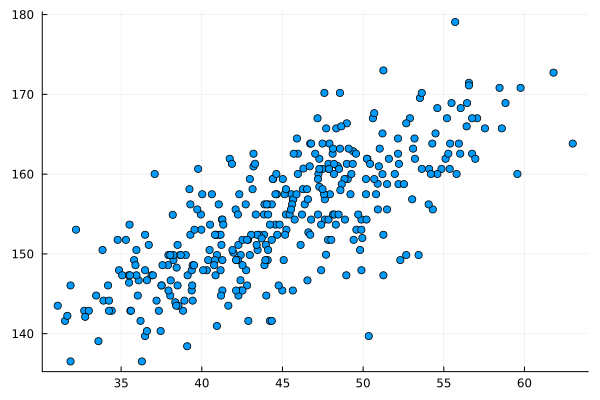

In [39]:
d = DataFrame(CSV.File("data/Howell1.csv"));
d2 = d[d.age .>= 18,:];
# fancy way of doing scatter(d2.weight, d2.height)
@df d2 scatter(:weight, :height)

## Code 4.38

In [39]:
Random.seed!(2971)
N = 100
a = rand(Normal(178, 20), N)
b = rand(Normal(0, 10), N);

## Code 4.39

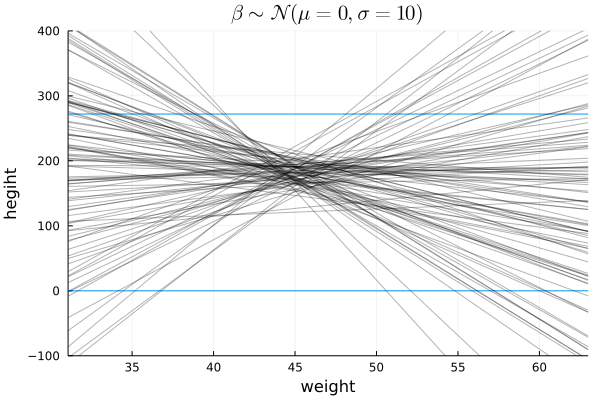

In [40]:
p = hline([0, 272]; ylims=(-100, 400), xlabel="weight", ylabel="hegiht")
title!(L"\beta \sim \mathcal{N}(\mu=0,\sigma=10)")

x_mean = mean(d2.weight)
xlims = extrema(d2.weight)  # getting min and max in one pass

for (α, β) ∈ zip(a, b)
    plot!(x -> α + β * (x - x_mean); xlims=xlims, c=:black, alpha=0.3)
end
display(p)

## Code 4.40

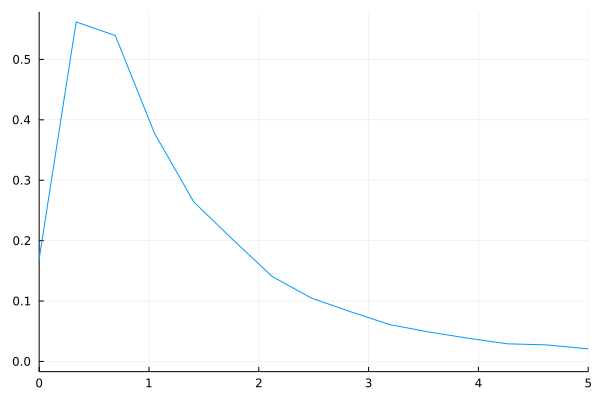

In [41]:
b = rand(LogNormal(0, 1), 10_000)
density(b, xlims=(0, 5), bandwidth=0.1)

## Code 4.41

In [42]:
Random.seed!(2971)
N = 100
a = rand(Normal(178, 20), N)
b = rand(LogNormal(0, 1), N);

## Code 4.42

In [43]:
d = DataFrame(CSV.File("data/Howell1.csv"));
d2 = d[d.age .>= 18,:]
xbar = mean(d2.weight)

@model function height_regr_model(weight, height)
    a ~ Normal(178, 20)
    b ~ LogNormal(0, 1)
    μ = @. a + b * (weight - xbar)
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

m4_3 = sample(height_regr_model(d2.weight, d2.height), NUTS(), 1000)
m4_3 = resetrange(m4_3);

## Code 4.43

In [44]:
@model function height_regr_model_exp(weight, height)
    a ~ Normal(178, 20)
    log_b ~ Normal(0, 1)
    μ = @. a + exp(log_b) * (weight - xbar)
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

m4_3b = sample(height_regr_model_exp(d2.weight, d2.height), NUTS(), 1000);

## Code 4.44

In [45]:
m4_3_df = DataFrame(m4_3)
precis(m4_3_df)

┌───────┬───────────────────────────────────────────────────────────┐
│ param │    mean     std     5.5%      50%    94.5%      histogram │
├───────┼───────────────────────────────────────────────────────────┤
│     a │ 154.589  0.2605  154.163  154.592  155.006      ▁▁▂▅██▅▂▁ │
│     b │   0.905   0.041   0.8402   0.9041   0.9717  ▁▁▂▄▆██▇▅▃▂▁▁ │
│     σ │   5.098  0.1957   4.8058   5.0888   5.4277   ▁▁▂▅███▆▄▃▁▁ │
└───────┴───────────────────────────────────────────────────────────┘


## Code 4.45

In [46]:
round.(cov(Matrix(m4_3_df)), digits=3)

3×3 Matrix{Float64}:
 0.068  0.001  0.001
 0.001  0.002  0.0
 0.001  0.0    0.038

## Code 4.46

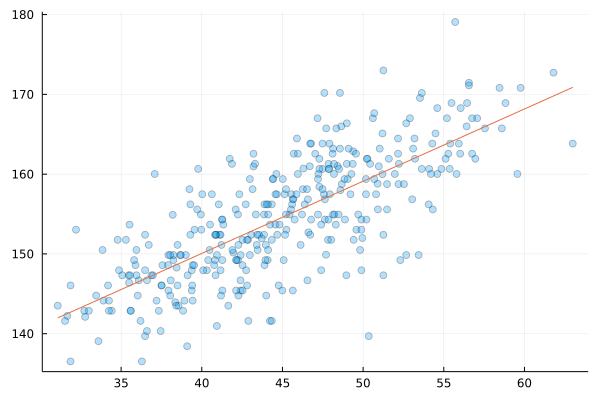

In [47]:
p = @df d2 scatter(:weight, :height; alpha=0.3)

chain = resetrange(m4_3)
samples = sample(chain, 1000)

a_map = mean(samples[:a])
b_map = mean(samples[:b])
plot!(x -> a_map + b_map*(x-xbar))

## Code 4.47

In [48]:
post = sample(m4_3, 1000)
post_df = DataFrame(post)
post_df[1:5,:]

,a,b,σ
,Float64,Float64,Float64
1,154.465,0.91025,4.96922
2,154.209,0.869266,5.17996
3,154.998,0.892325,5.09778
4,154.501,0.9345,4.72493
5,154.423,0.853054,5.35971


## Code 4.48

In [49]:
N = 10
dN = d2[1:N,:]

@model function height_regr_model_N(weight, height)
    a ~ Normal(178, 20)
    b ~ LogNormal(0, 1)
    m_weight = mean(weight)
    μ = @. a + b * (weight - m_weight)
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

mN = sample(height_regr_model(dN.weight, dN.height), NUTS(), 1000)
mN = resetrange(mN);

## Code 4.49

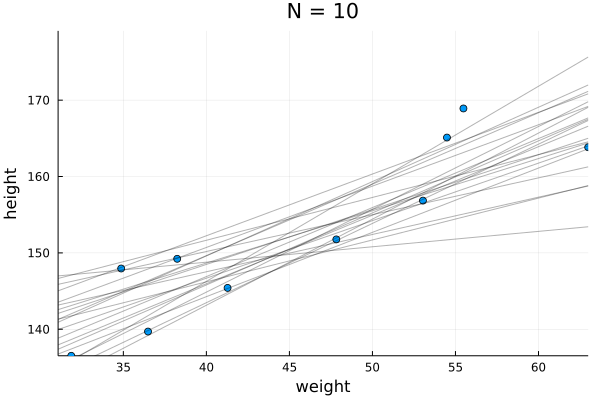

In [50]:
post = sample(mN, 20)
post_df = DataFrame(post);

xlims = extrema(d2.weight)
ylims = extrema(d2.height)
p = @df dN scatter(:weight, :height; xlims=xlims, ylims=ylims)
title!("N = $N"; xlab="weight", ylab="height")

x_mean = mean(dN.weight)
for (a, b) ∈ zip(post_df.a, post_df.b)
    plot!(x -> a + b * (x-x_mean); c="black", alpha=0.3)
end
display(p)

## Code 4.50

In [51]:
post = sample(m4_3, 1000)
post_df = DataFrame(post)
μ_at_50 = @. post_df.a + post_df.b * (50 - xbar);

## Code 4.51

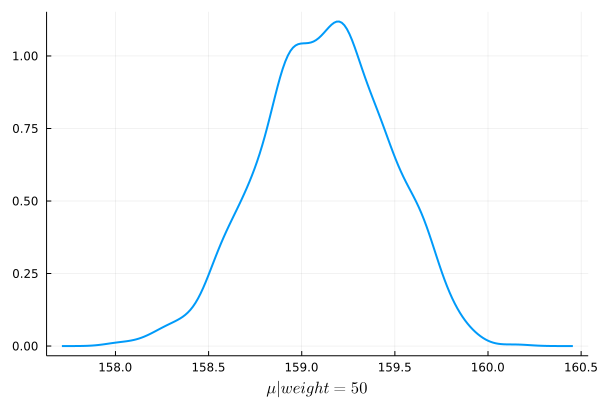

In [52]:
density(μ_at_50; lw=2, xlab=L"\mu|weight=50")

## Code 4.52

In [53]:
PI(μ_at_50)

2-element Vector{Float64}:
 158.57002789554085
 159.6651868989757

## Code 4.53

In [54]:
μ = link(post_df, [:a :b], d2.weight, xbar);
μ = hcat(μ...);
Base.size(μ), μ[1:5,1]

((1000, 352), [157.30402446200378, 156.8659470071084, 156.79036549722116, 157.15231115026998, 156.841321474765])

## Code 4.54

In [55]:
weight_seq = 25:70
μ = link(post_df, [:a :b], weight_seq, xbar);
μ = hcat(μ...);
Base.size(μ), μ[1:5,1]

((1000, 46), [135.54235296248638, 136.8171208342461, 136.41803987120076, 137.15923430935746, 137.36985081806435])

## Code 4.55

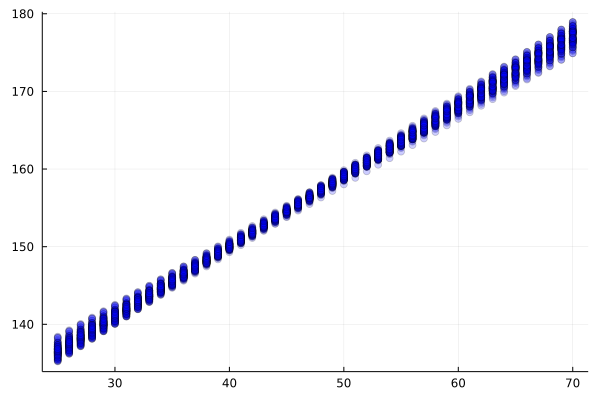

In [56]:
p = plot()
for i in 1:100
    scatter!(weight_seq, μ[i,:]; c=:blue, alpha=0.2)
end
display(p)

## Code 4.56

In [57]:
μ_mean = mean.(eachcol(μ))
μ_PI = PI.(eachcol(μ))
μ_PI = vcat(μ_PI'...);

## Code 4.57

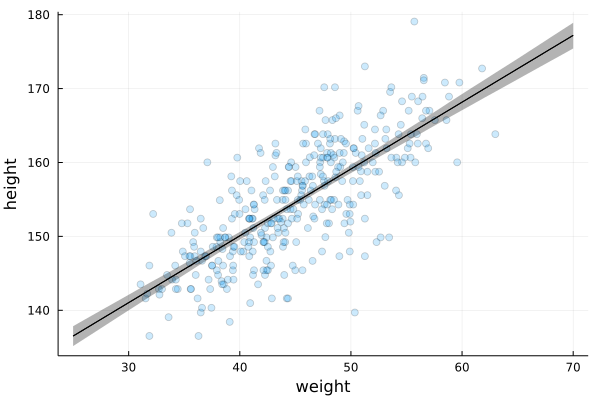

In [58]:
@df d2 scatter(:weight, :height; alpha=0.2, xlab="weight", ylab="height")
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=μ_PI, fillalpha=0.3)

## Code 4.58

In [59]:
post = sample(m4_3, 1000)
post = DataFrame(post)

weight_seq = 25:70
μ = map(w -> post.a + post.b * (w - xbar), weight_seq)
μ = hcat(μ...)
μ_mean = mean.(eachcol(μ))
μ_CI = PI.(eachcol(μ));

## Code 4.59

In [60]:
sim_height = simulate(post, [:a, :b, :σ], weight_seq .- xbar);
Base.size(sim_height), sim_height[1:5,1]

((1000, 46), [140.9740643278276, 130.13224080628405, 138.68393185320338, 134.3163947982685, 128.9830302969236])

## Code 4.60

In [61]:
height_PI = PI.(eachcol(sim_height))
height_PI = vcat(height_PI'...);

## Code 4.61

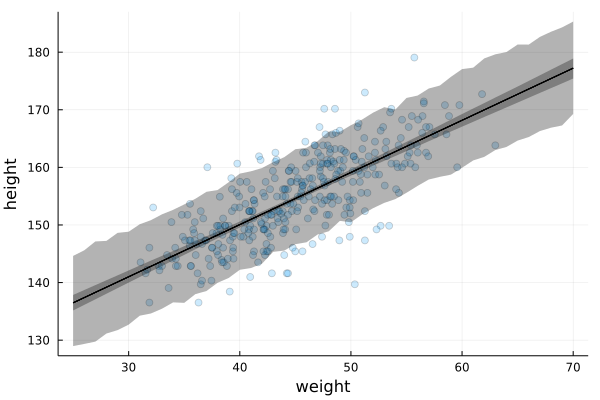

In [62]:
@df d2 scatter(:weight, :height; alpha=0.2, xlab="weight", ylab="height")
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=μ_PI, fillalpha=0.3)
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

## Code 4.62

In [63]:
post = sample(m4_3, 10_000)
post = DataFrame(post)
sim_height = simulate(post, [:a, :b, :σ], weight_seq .- xbar)
height_PI = PI.(eachcol(sim_height))
height_PI = vcat(height_PI'...);

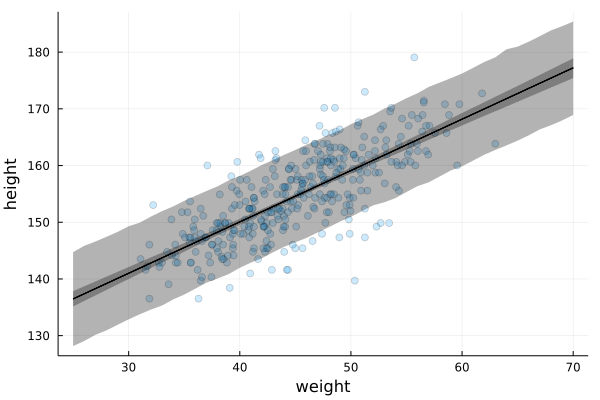

In [64]:
@df d2 scatter(:weight, :height; alpha=0.2, xlab="weight", ylab="height")
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=μ_PI, fillalpha=0.3)
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

## Code 4.63

In [65]:
post = sample(m4_3, 1000)
post = DataFrame(post)

sim_height = [
    [
        rand(Normal(a + b * (w - xbar), σ))
        for (a, b, σ) ∈ zip(post.a, post.b, post.σ)
    ]
    for w ∈ weight_seq
]
sim_height = hcat(sim_height...)

height_PI = PI.(eachcol(sim_height));
height_PI = vcat(height_PI'...);

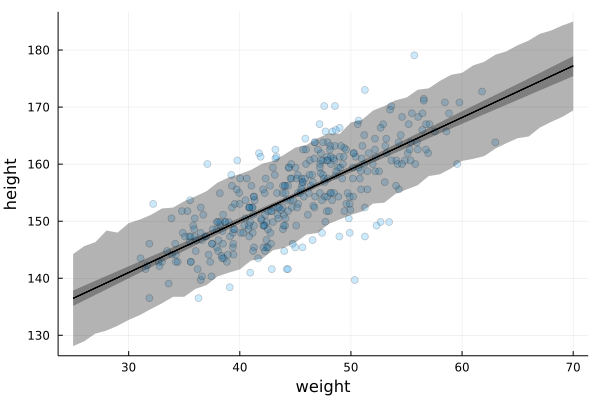

In [66]:
@df d2 scatter(:weight, :height; alpha=0.2, xlab="weight", ylab="height")
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=μ_PI, fillalpha=0.3)
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

# 4.5 Curves from lines

## Code 4.64

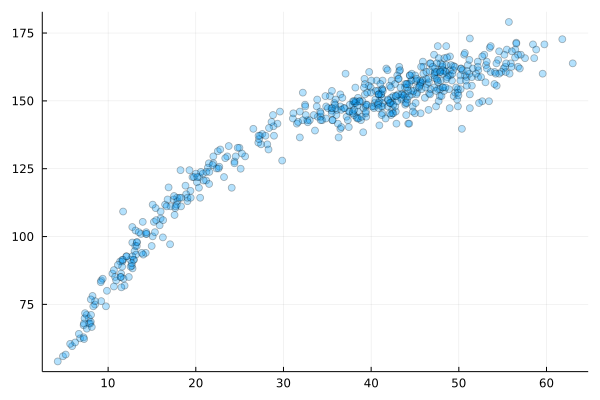

In [67]:
d = DataFrame(CSV.File("data/Howell1.csv"))
scatter(d.weight, d.height; alpha=0.3)

## Code 4.65

In [68]:
d[!, :weight_s] = standardize(ZScoreTransform, d.weight)
d[!, :weight_s2] = d.weight_s.^2;

@model function height_regr_m2(weight_s, weight_s2, height)
    a ~ Normal(178, 20)
    b1 ~ LogNormal(0, 1)
    b2 ~ Normal(0, 1)
    μ = @. a + b1 * weight_s + b2 * weight_s2
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

m4_5 = sample(height_regr_m2(d.weight_s, d.weight_s2, d.height), NUTS(), 1000)
m4_5 = resetrange(m4_5)
m4_5_df = DataFrame(m4_5);

## Code 4.66

In [69]:
precis(m4_5_df)

┌───────┬───────────────────────────────────────────────────────────┐
│ param │    mean     std     5.5%      50%    94.5%      histogram │
├───────┼───────────────────────────────────────────────────────────┤
│     a │ 146.044  0.3754  145.419   146.06  146.627  ▁▁▁▂▃▅▇█▇▄▂▁▁ │
│    b1 │ 21.7413  0.2826  21.2854  21.7375  22.1805     ▁▁▂▆█▇▄▂▁▁ │
│    b2 │ -7.7903  0.2673  -8.2011  -7.7943  -7.3547     ▁▂▅██▅▂▁▁▁ │
│     σ │  5.8069  0.1767   5.5367    5.803   6.0976  ▁▁▁▄▆██▆▃▂▁▁▁ │
└───────┴───────────────────────────────────────────────────────────┘


## Code 4.67

In [70]:
Random.seed!(1)
df = sample(m4_5_df, 1000)
weight_seq = range(-2.2, 2; length=30)

mu = link(df, (r, x) -> r.a + r.b1*x + r.b2*x^2, weight_seq)
mu = hcat(mu...)
mu_mean = mean.(eachcol(mu))
mu_PI = PI.(eachcol(mu))
mu_PI = vcat(mu_PI'...)

sim_height = simulate(df, (r, x) -> Normal(r.a + r.b1*x + r.b2*x^2, r.σ), weight_seq)
sim_height = vcat(sim_height'...);

height_PI = PI.(eachcol(sim_height))
height_PI = vcat(height_PI'...);

## Code 4.68

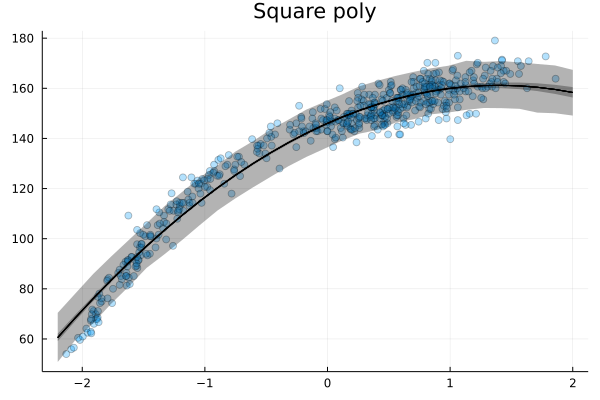

In [71]:
p_square = @df d scatter(:weight_s, :height; alpha=0.3, title="Square poly")
plot!(weight_seq, mu_mean; c=:black)
plot!(weight_seq, [mu_mean mu_mean]; c=:black, fillrange=mu_PI, fillalpha=0.3)
plot!(weight_seq, [mu_mean mu_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

## Code 4.69

In [72]:
d[!, :weight_s3] = d.weight_s.^3;

@model function height_regr_m3(weight_s, weight_s2, weight_s3, height)
    a ~ Normal(178, 20)
    b1 ~ LogNormal(0, 1)
    b2 ~ Normal(0, 1)
    b3 ~ Normal(0, 1)
    μ = @. a + b1 * weight_s + b2 * weight_s2 + b3 * weight_s3
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

m4_6 = sample(height_regr_m3(d.weight_s, d.weight_s2, d.weight_s3, d.height), NUTS(), 1000)
m4_6 = resetrange(m4_6)
m4_6_df = DataFrame(m4_6)
precis(m4_6_df)

┌───────┬─────────────────────────────────────────────────────────┐
│ param │    mean     std     5.5%      50%    94.5%    histogram │
├───────┼─────────────────────────────────────────────────────────┤
│     a │  146.39  0.3147  145.907  146.389  146.898  ▁▁▃▆██▅▃▁▁▁ │
│    b1 │ 15.2378  0.4896  14.4475  15.2349  16.0455      ▁▂▆█▅▂▁ │
│    b2 │ -6.2086  0.2688  -6.6249   -6.225   -5.757    ▁▁▂▅█▇▄▂▁ │
│    b3 │  3.5726  0.2366   3.2018   3.5753   3.9548     ▁▂▅██▄▁▁ │
│     σ │  4.8559   0.148   4.6266   4.8559   5.1009   ▁▁▄▆█▆▄▂▁▁ │
└───────┴─────────────────────────────────────────────────────────┘


In [73]:
Random.seed!(1)
df = sample(m4_6_df, 1000)
weight_seq = range(-2.2, 2; length=30)

func = (r, x) -> r.a + r.b1*x + r.b2*x^2 + r.b3*x^3
mu = link(df, func, weight_seq)
mu = hcat(mu...)
mu_mean = mean.(eachcol(mu))
mu_PI = PI.(eachcol(mu))
mu_PI = vcat(mu_PI'...)

func = (r, x) -> Normal(r.a + r.b1*x + r.b2*x^2 + r.b3*x^3, r.σ)
sim_height = simulate(df, func, weight_seq)
sim_height = vcat(sim_height'...);

height_PI = PI.(eachcol(sim_height))
height_PI = vcat(height_PI'...);

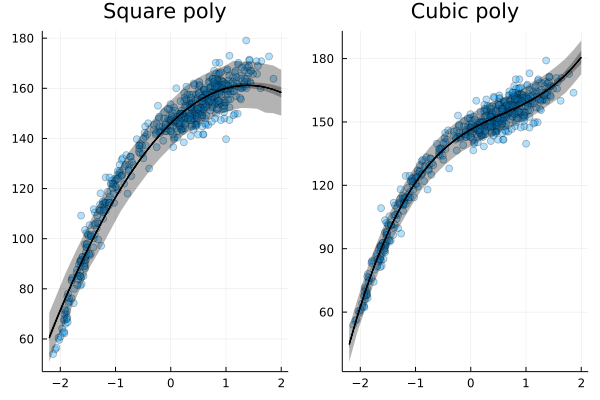

In [74]:
p_cubic = @df d scatter(:weight_s, :height; alpha=0.3, title="Cubic poly")
plot!(weight_seq, mu_mean; c=:black)
plot!(weight_seq, [mu_mean mu_mean]; c=:black, fillrange=mu_PI, fillalpha=0.3)
plot!(weight_seq, [mu_mean mu_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

plot(p_square, p_cubic; layout=(1, 2))

## Code 4.70 and 4.71

Looks like Julia plots don't support change of ticks proposed in the book.
But much more natural way will be to remap values we're plotting back to the original scale.
Example of this is below.

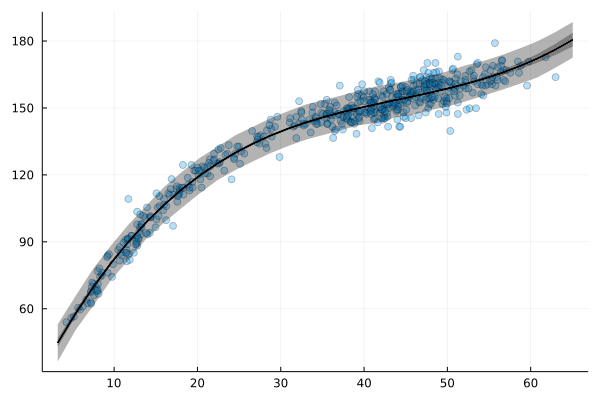

In [75]:
μ = mean(d.weight)
σ = std(d.weight)
w = @. d.weight_s * σ + μ
scatter(w, d.height; alpha=0.3)

w_s = @. weight_seq * σ + μ
plot!(w_s, mu_mean; c=:black)
plot!(w_s, [mu_mean mu_mean]; c=:black, fillrange=mu_PI, fillalpha=0.3)
plot!(w_s, [mu_mean mu_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

## Code 4.72

In [76]:
d = DataFrame(CSV.File("data/cherry_blossoms.csv", missingstring="NA"))
precis(d)

┌────────────┬─────────────────────────────────────────────────────────┐
│      param │   mean      std    5.5%     50%    94.5%      histogram │
├────────────┼─────────────────────────────────────────────────────────┤
│       year │ 1408.0  350.885  867.77  1408.0  1948.23  ████████████▂ │
│        doy │ 104.54    6.407   94.43   105.0    115.0       ▁▂▆██▅▂▁ │
│       temp │ 6.1419   0.6636    5.15     6.1   7.2947       ▁▄▆█▄▂▁▁ │
│ temp_upper │ 7.1852   0.9929  5.8977    7.04   8.9023       ▂██▃▁▁▁▁ │
│ temp_lower │ 5.0989   0.8503  3.7876   5.145     6.37       ▁▁▁▂▇█▂▁ │
└────────────┴─────────────────────────────────────────────────────────┘


## Code 4.73

In [77]:
d2 = d[completecases(d[!,[:doy]]),:]
d2 = disallowmissing(d2[!,[:year,:doy]])
num_knots = 15
knots_list = quantile(d2.year, range(0, 1; length=num_knots));

## Code 4.74

In [78]:
using BSplines

basis = BSplineBasis(3, knots_list)

16-element BSplineBasis{Vector{Float64}}:
 order: 3
 breakpoints: [812.0, 1036.0, 1174.0, 1269.0, 1377.0, 1454.0, 1518.0, 1583.0, 1650.0, 1714.0, 1774.0, 1833.0, 1893.0, 1956.0, 2015.0]

## Code 4.75

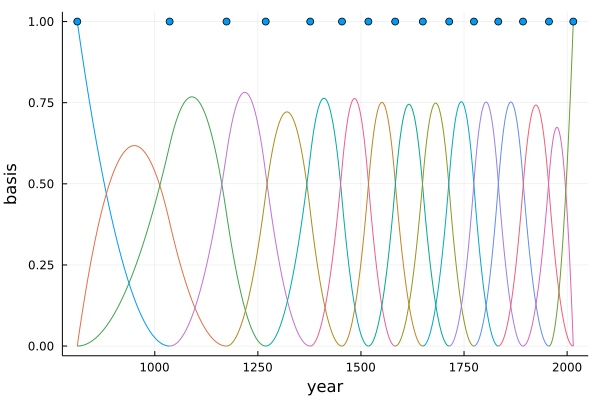

In [79]:
p1 = plot(basis)
scatter!(knots_list, repeat([1], num_knots); xlab="year", ylab="basis", legend=false)

## Code 4.76

This way of calucalting bsplines is slightly slower, than shown in the book (with pre-calculated matrix) but it is much cleaner in my perspective.

You can do comparison yourself by precalculating spline matrix outside of the model and do matrix multiplication in the model instead of spline evialutaion. Example of doing this is at code block 4.79

In [80]:
@model function model_splines(year, doy)
    w ~ MvNormal(zeros(length(basis)), 1)
    a ~ Normal(100, 10)
    s = Spline(basis, w)
    μ = a .+ s.(year)
    σ ~ Exponential(1)
    doy ~ MvNormal(μ, σ)
end

m4_7 = sample(model_splines(d2.year, d2.doy), NUTS(0.65; init_ϵ = 9.765625e-5), 1000)

Chains MCMC chain (1000×30×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 12.56 seconds
Compute duration  = 12.56 seconds
parameters        = w[1], w[2], w[3], w[4], w[5], w[6], w[7], w[8], w[9], w[10], w[11], w[12], w[13], w[14], w[15], w[16], a, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std   naive_se      mcse         ess      rhat   ⋯
      Symbol    Float64   Float64    Float64   Float64     Float64   Float64   ⋯

        w[1]    -0.6930    0.9362     0.0296    0.0215   1945.2764    0.9994   ⋯
        w[2]    -0.8597    0.8902     0.0282    0.0159   3252.6949    0.9990   ⋯
        w[3]     0.8102    0.7776     0.0246    0.0199   1338.4246    0.9990   ⋯
        w[4]     0.6773    0.7727     0.0244  

## Code 4.77

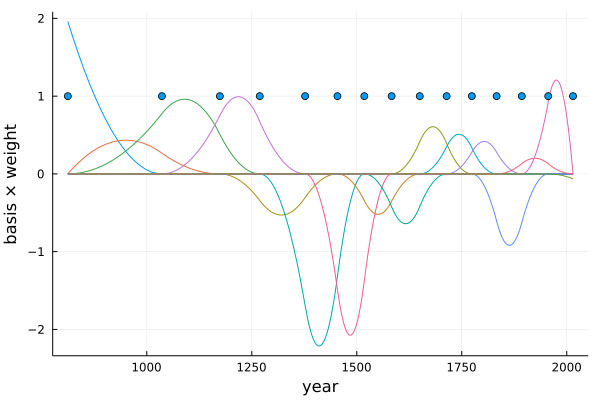

In [81]:
post = DataFrame(m4_7)

# convert columns w[*] into single column w
w_df = DataFrames.select(post, r"w")
post = DataFrames.select(post, Not(r"w"))
post[!,:w] = Vector.(eachrow(w_df))

# vector of 16 average w values
w_mean = mean.(eachcol(w_df))
p2 = plot(basis .* w_mean)
scatter!(knots_list, repeat([1], num_knots); xlab="year", ylab="basis × weight")

## Code 4.78

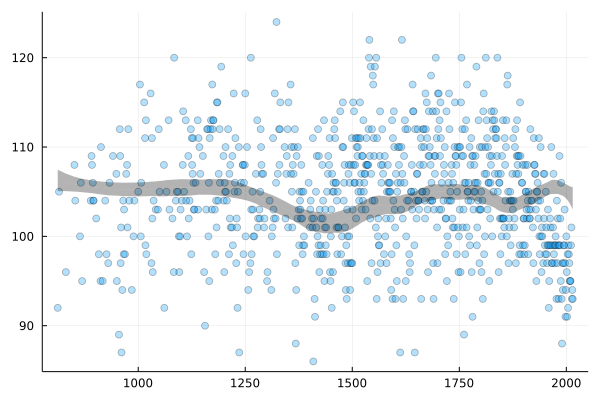

In [82]:
μ = link(post, (r, x) -> r.a + Spline(basis, r.w)(x), d2.year)
μ = vcat(μ'...);

μ_PI = PI.(eachrow(μ))
μ_PI = vcat(μ_PI'...);

p3 = @df d2 scatter(:year, :doy; alpha=0.3)
μ_mean = mean.(eachrow(μ_PI))
plot!(d2.year, [μ_mean, μ_mean]; c=:black, fillrange=μ_PI, fillalpha=0.3, alpha=0)

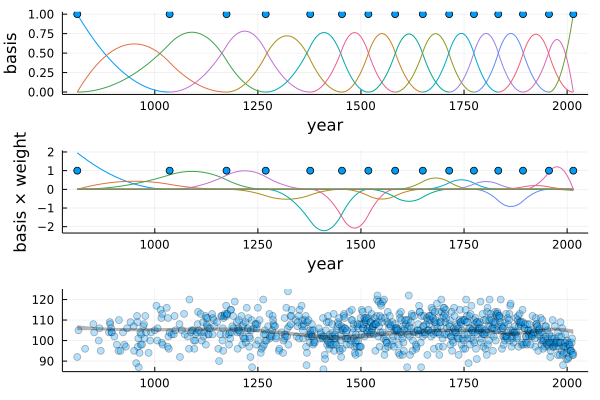

In [83]:
plot(p1, p2, p3; layout=(3, 1))

## Code 4.79

How to build the model with explicit spline matrix calculation

In [84]:
basis = BSplineBasis(3, knots_list)

# list of splines with 1 only at corresponding basis index
splines = [
    Spline(basis, [float(idx == knot) for idx ∈ 1:length(basis)])
    for knot ∈ 1:length(basis)
]

# calculate each spline for every year. Resulting matrix B is 827x16
B = [
    map(s -> s(year), splines)
    for year in d2.year
]
B = vcat(B'...);


# do not need years parameter anymore, all the information is in B matrix
@model function model_splines_matrix(doy)
    w ~ MvNormal(zeros(length(basis)), 1)
    a ~ Normal(100, 10)
    μ = a .+ B * w
    σ ~ Exponential(1)
    doy ~ MvNormal(μ, σ)
end

m4_7alt = sample(model_splines_matrix(d2.doy), NUTS(0.65; init_ϵ = 0.0001953125), 1000)

Chains MCMC chain (1000×30×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 4.67 seconds
Compute duration  = 4.67 seconds
parameters        = w[1], w[2], w[3], w[4], w[5], w[6], w[7], w[8], w[9], w[10], w[11], w[12], w[13], w[14], w[15], w[16], a, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std   naive_se      mcse         ess      rhat   ⋯
      Symbol    Float64   Float64    Float64   Float64     Float64   Float64   ⋯

        w[1]    -0.7241    0.8998     0.0285    0.0271   1697.9565    0.9997   ⋯
        w[2]    -0.8411    0.8831     0.0279    0.0221   2165.6782    0.9990   ⋯
        w[3]     0.8419    0.8046     0.0254    0.0224   1451.9809    1.0014   ⋯
        w[4]     0.6414    0.7654     0.0242    